In [124]:
!git clone https://github.com/matterport/Mask_RCNN.git

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 111.84 MiB | 43.59 MiB/s, done.
Resolving deltas: 100% (569/569), done.


In [125]:
!git clone https://github.com/cocodataset/cocoapi

Cloning into 'cocoapi'...
remote: Enumerating objects: 965, done.
remote: Total 965 (delta 0), reused 0 (delta 0), pack-reused 965
Receiving objects: 100% (965/965), 11.72 MiB | 28.36 MiB/s, done.
Resolving deltas: 100% (570/570), done.


In [126]:
%cd Mask_RCNN

!pip3 install -r requirements.txt
!python3 setup.py install

/content/Mask_RCNN/Mask_RCNN/Mask_RCNN/Mask_RCNN/Mask_RCNN
running install
running bdist_egg
running egg_info
creating mask_rcnn.egg-info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_links to mask_rcnn.egg-info/dependency_links.txt
writing top-level names to mask_rcnn.egg-info/top_level.txt
writing manifest file 'mask_rcnn.egg-info/SOURCES.txt'
reading manifest template 'MANIFEST.in'
writing manifest file 'mask_rcnn.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
creating build
creating build/lib
creating build/lib/mrcnn
copying mrcnn/model.py -> build/lib/mrcnn
copying mrcnn/utils.py -> build/lib/mrcnn
copying mrcnn/config.py -> build/lib/mrcnn
copying mrcnn/visualize.py -> build/lib/mrcnn
copying mrcnn/parallel_model.py -> build/lib/mrcnn
copying mrcnn/__init__.py -> build/lib/mrcnn
creating build/bdist.linux-x86_64
creating build/bdist.linux-x86_64/egg
creating build/bdist.linux-x86_64/egg/mrcnn
copying bui

In [127]:
!wget http://jacarini.dinf.usherbrooke.ca/static/pedestrian%20detection//pedestrian%20detection%20dataset.zip

--2020-02-06 04:09:24--  http://jacarini.dinf.usherbrooke.ca/static/pedestrian%20detection//pedestrian%20detection%20dataset.zip
Resolving jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)... 132.210.238.218
Connecting to jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)|132.210.238.218|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 679089159 (648M) [application/zip]
Saving to: ‘pedestrian detection dataset.zip’

pedestrian detectio 100%[===================>] 647.63M  71.8MB/s    in 9.3s    

2020-02-06 04:09:34 (69.9 MB/s) - ‘pedestrian detection dataset.zip’ saved [679089159/679089159]



In [128]:
!unzip "pedestrian detection dataset"


Archive:  pedestrian detection dataset.zip
   creating: pedestrian detection dataset/
   creating: pedestrian detection dataset/PETS2006/
  inflating: pedestrian detection dataset/PETS2006/gt.txt  
   creating: pedestrian detection dataset/PETS2006/input/
  inflating: pedestrian detection dataset/PETS2006/input/in000001.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000002.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000003.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000004.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000005.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000006.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000007.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000008.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000009.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000010.jpg  
  inflating: pedestrian 

In [150]:
!wget http://jacarini.dinf.usherbrooke.ca/static/pedestrian%20detection/pedestrian%20detection%20groundtruth.zip
!unzip 'pedestrian detection groundtruth'

--2020-02-06 04:18:29--  http://jacarini.dinf.usherbrooke.ca/static/pedestrian%20detection/pedestrian%20detection%20groundtruth.zip
Resolving jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)... 132.210.238.218
Connecting to jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)|132.210.238.218|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 119881 (117K) [application/zip]
Saving to: ‘pedestrian detection groundtruth.zip.2’

pedestrian detectio 100%[===================>] 117.07K  --.-KB/s    in 0.1s    

2020-02-06 04:18:29 (1.02 MB/s) - ‘pedestrian detection groundtruth.zip.2’ saved [119881/119881]

Archive:  pedestrian detection groundtruth.zip
   creating: PETS2006/
  inflating: PETS2006/gt.txt         
   creating: backdoor/
  inflating: backdoor/gt.txt         
   creating: busStation/
  inflating: busStation/gt.txt       
   creating: copyMachine/
  inflating: copyMachine/gt.txt      
   creating: cubicle/
  inflating: cubicle/gt.txt       

In [129]:
!pip3 install -U scikit-image
!pip3 install -U cython 
!pip3 install "git+https://github.com/philferriere/cocoapi.git#egg=pycocotools&subdirectory=PythonAPI"


Requirement already up-to-date: scikit-image in /usr/local/lib/python3.6/dist-packages (0.16.2)
Requirement already up-to-date: cython in /usr/local/lib/python3.6/dist-packages (0.29.14)


In [0]:
# USAGE
# python mask_rcnn.py --mask-rcnn mask-rcnn-coco --image images/example_01.jpg
# python mask_rcnn.py --mask-rcnn mask-rcnn-coco --image images/example_03.jpg --visualize 1

# import the necessary packages
import numpy as np
import argparse
import random
import time
import cv2
import os
import cython
import matplotlib
import sklearn
import tensorflow
import keras
import cv2
import h5py
import imgaug
import IPython
import skimage
import matplotlib.pyplot as plt
import os
import sys




In [0]:
# Root directory of the project
ROOT_DIR =  os.getcwd()  #os.path.abspath("../")

import warnings
warnings.filterwarnings("ignore")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
# Import COCO config
sys.path.append(os.path.join(ROOT_DIR, "samples/coco/"))  # To find local version
import coco

%matplotlib inline

In [132]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join('', "mask_rcnn_coco.h5")

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "images")

... done downloading pretrained model!


In [133]:
class InferenceConfig(coco.CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [0]:
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir='mask_rcnn_coco.hy', config=config)

# Load weights trained on MS-COCO
model.load_weights('mask_rcnn_coco.h5', by_name=True)

In [0]:
#Class names
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

In [136]:
mask = r['masks']
mask = mask.astype(int)
mask.shape

(450, 700, 1)

In [137]:
#Load from the bad weather (blizzard) dataset
!wget http://jacarini.dinf.usherbrooke.ca/static/dataset/badWeather/blizzard.zip
!unzip "blizzard"

--2020-02-06 04:10:07--  http://jacarini.dinf.usherbrooke.ca/static/dataset/badWeather/blizzard.zip
Resolving jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)... 132.210.238.218
Connecting to jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)|132.210.238.218|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 79027548 (75M) [application/zip]
Saving to: ‘blizzard.zip’

blizzard.zip        100%[===================>]  75.37M  57.9MB/s    in 1.3s    

2020-02-06 04:10:09 (57.9 MB/s) - ‘blizzard.zip’ saved [79027548/79027548]

Archive:  blizzard.zip
   creating: blizzard/
  inflating: blizzard/ROI.bmp        
  inflating: blizzard/ROI.jpg        
   creating: blizzard/groundtruth/
  inflating: blizzard/groundtruth/gt000001.png  
  inflating: blizzard/groundtruth/gt000002.png  
  inflating: blizzard/groundtruth/gt000003.png  
  inflating: blizzard/groundtruth/gt000004.png  
  inflating: blizzard/groundtruth/gt000005.png  
  inflating: blizzard/groundt

In [138]:
#Load from the nighttime dataset
!wget http://jacarini.dinf.usherbrooke.ca/static/dataset/nightVideos.zip
!unzip "nightVideos"

--2020-02-06 04:10:13--  http://jacarini.dinf.usherbrooke.ca/static/dataset/nightVideos.zip
Resolving jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)... 132.210.238.218
Connecting to jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)|132.210.238.218|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 318634228 (304M) [application/zip]
Saving to: ‘nightVideos.zip’

nightVideos.zip     100%[===================>] 303.87M  69.2MB/s    in 4.6s    

2020-02-06 04:10:18 (65.4 MB/s) - ‘nightVideos.zip’ saved [318634228/318634228]

Archive:  nightVideos.zip
  inflating: README.txt              
   creating: nightVideos/
   creating: nightVideos/bridgeEntry/
  inflating: nightVideos/bridgeEntry/ROI.bmp  
  inflating: nightVideos/bridgeEntry/ROI.jpg  
   creating: nightVideos/bridgeEntry/groundtruth/
  inflating: nightVideos/bridgeEntry/groundtruth/gt000001.png  
  inflating: nightVideos/bridgeEntry/groundtruth/gt000002.png  
  inflating: nightVideos/brid

Processing 1 images
image                    shape: (240, 360, 3)         min:   24.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


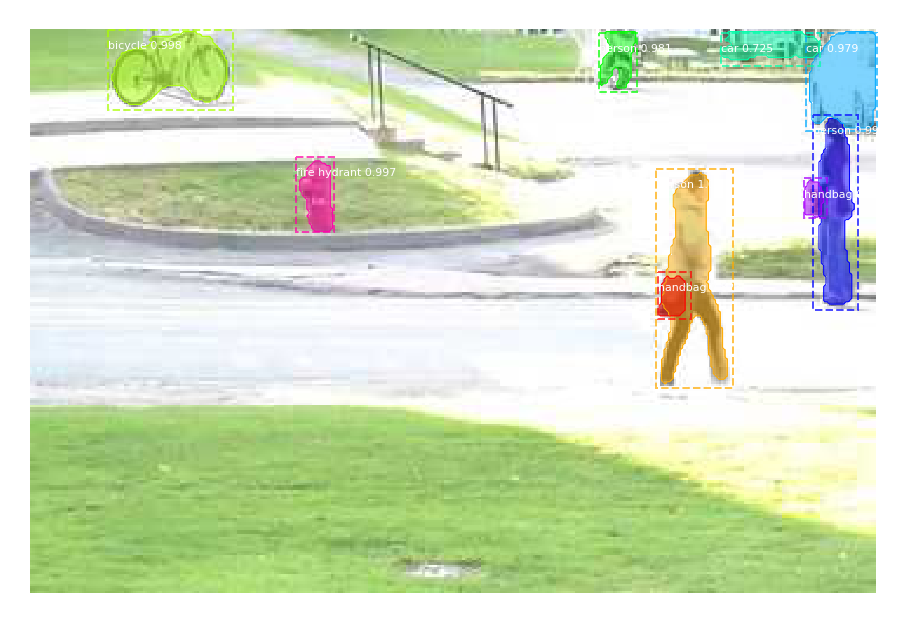

Processing 1 images
image                    shape: (240, 360, 3)         min:   29.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


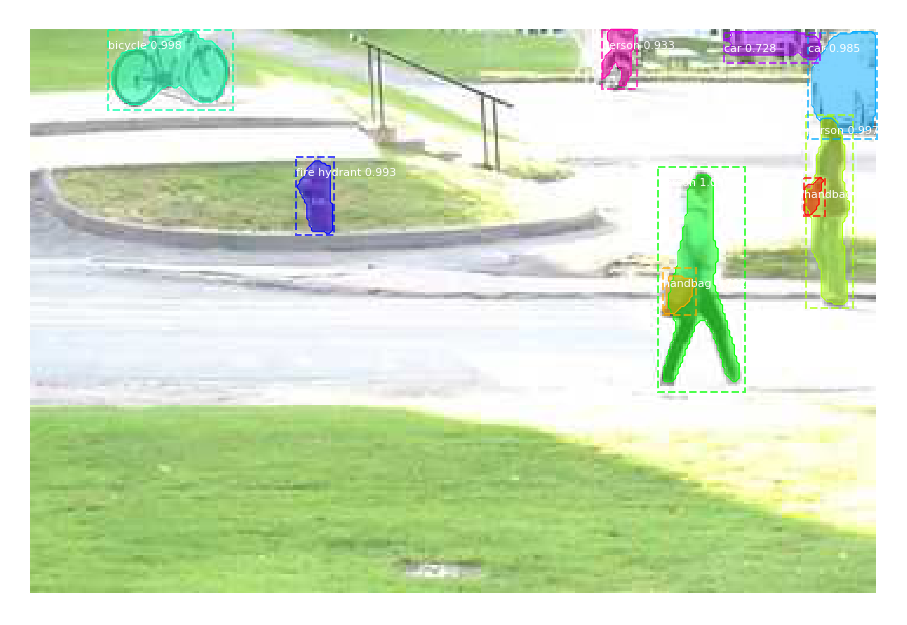

Processing 1 images
image                    shape: (240, 360, 3)         min:   32.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


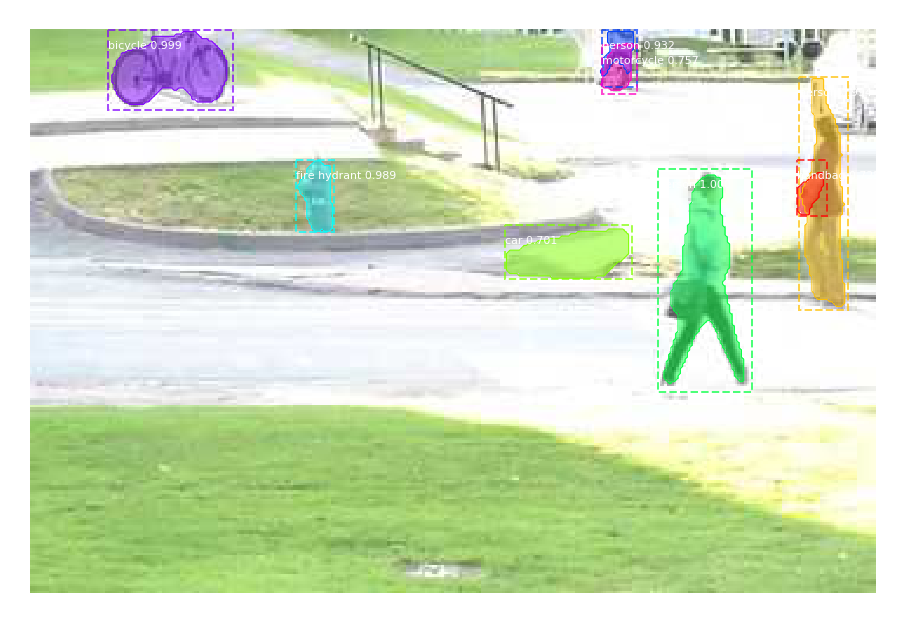

Processing 1 images
image                    shape: (240, 360, 3)         min:   32.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


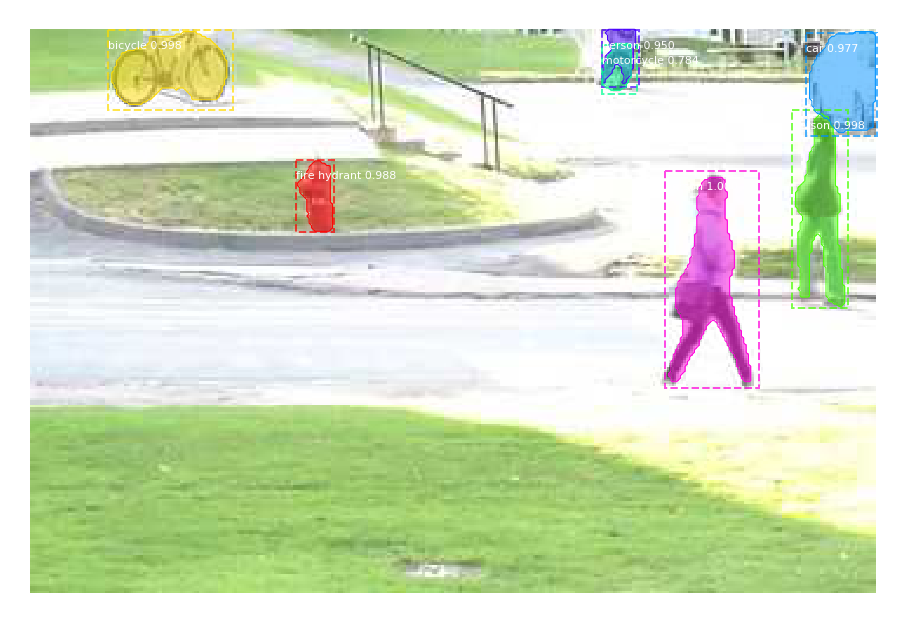

Processing 1 images
image                    shape: (240, 360, 3)         min:   31.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


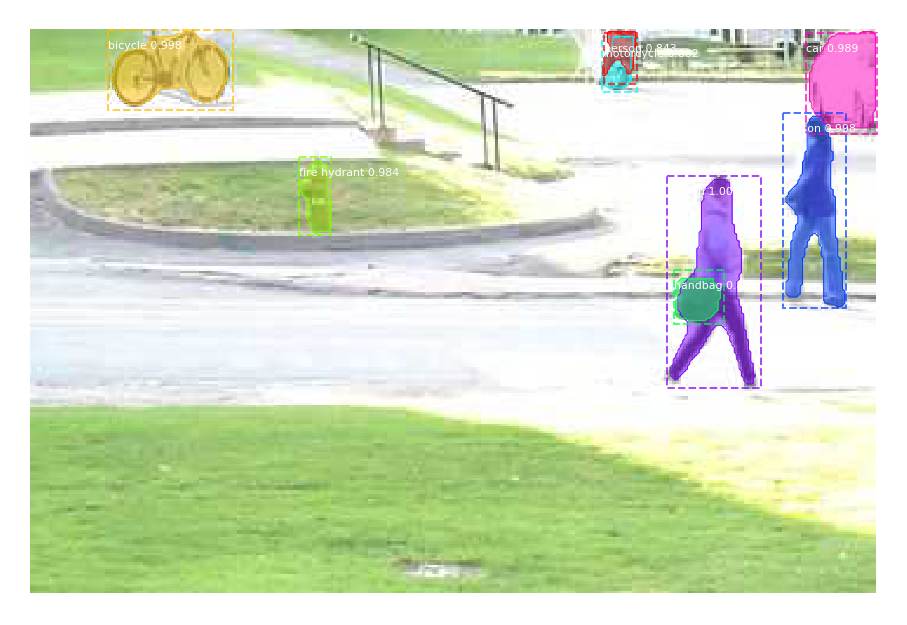

Processing 1 images
image                    shape: (240, 360, 3)         min:   30.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


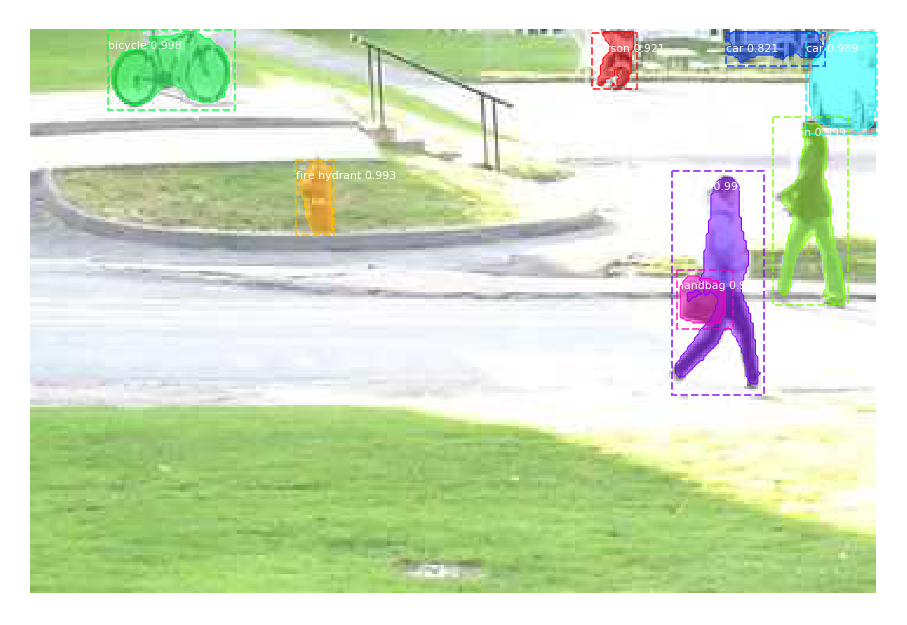

In [139]:
# Load and process five frames from the baseline pedestrians dataset
#frames in000417 - in000422
directory = '/content/Mask_RCNN/pedestrian detection dataset/pedestrians/input'
frames = ["in000417.jpg", "in000418.jpg", "in000419.jpg", "in000420.jpg", "in000421.jpg", "in000422.jpg"]
for file in frames:
    image = skimage.io.imread(os.path.join("/content/Mask_RCNN/pedestrian detection dataset/pedestrians/input", file))
    # Run detection
    results = model.detect([image], verbose=1)
    # Visualize results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                        class_names, r['scores'])

Processing 1 images
image                    shape: (480, 720, 3)         min:   82.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  140.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


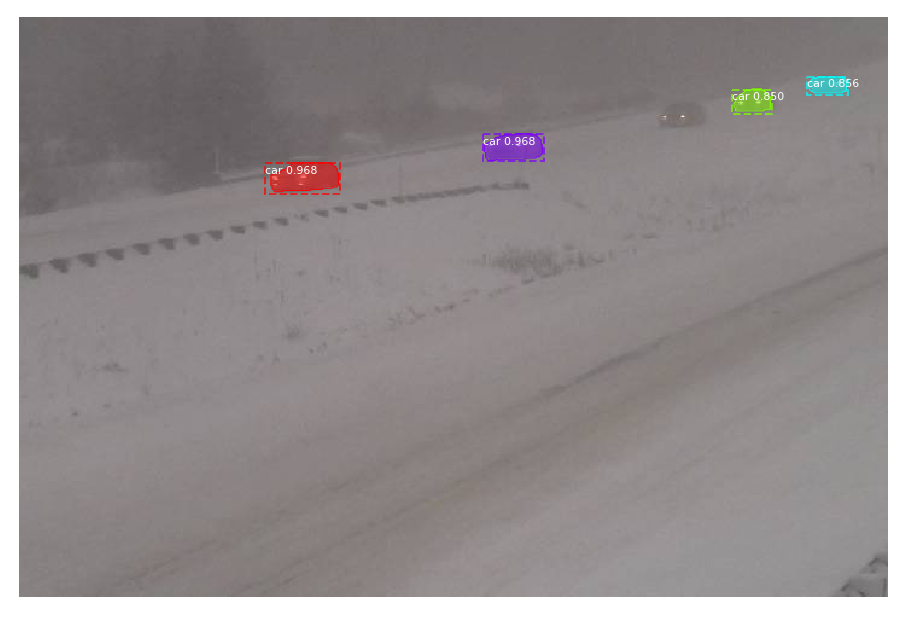

Processing 1 images
image                    shape: (480, 720, 3)         min:   86.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


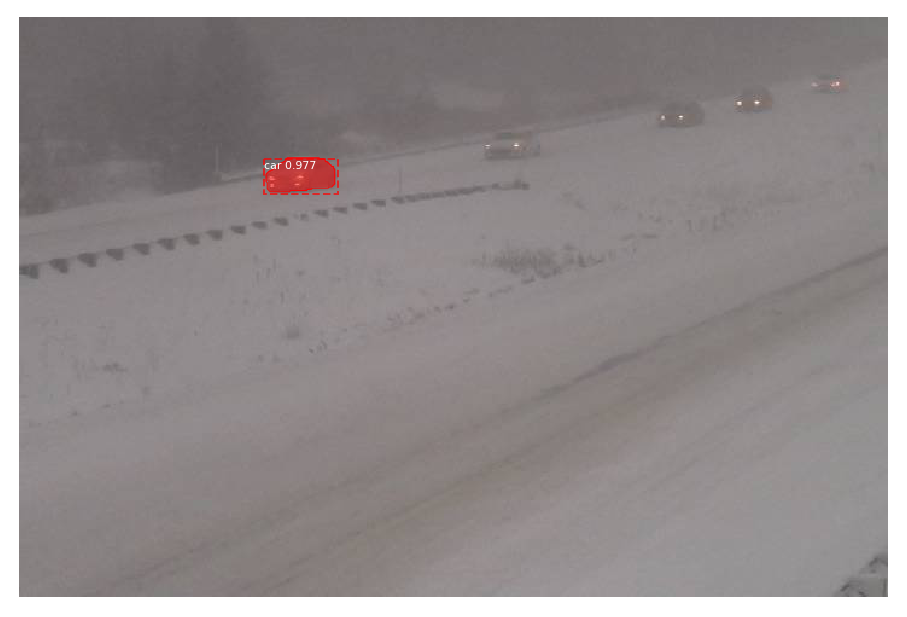

Processing 1 images
image                    shape: (480, 720, 3)         min:   87.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  129.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


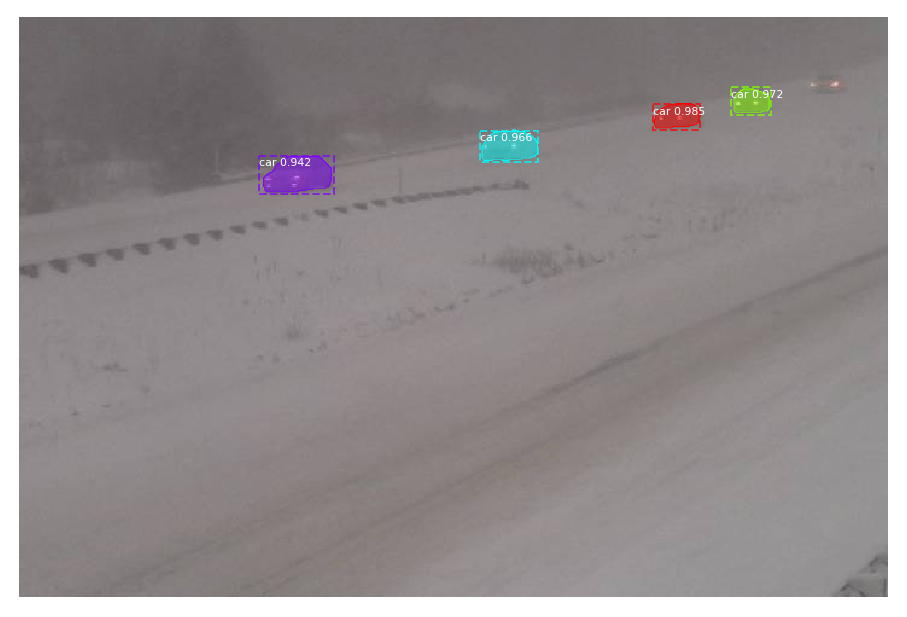

Processing 1 images
image                    shape: (480, 720, 3)         min:   84.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


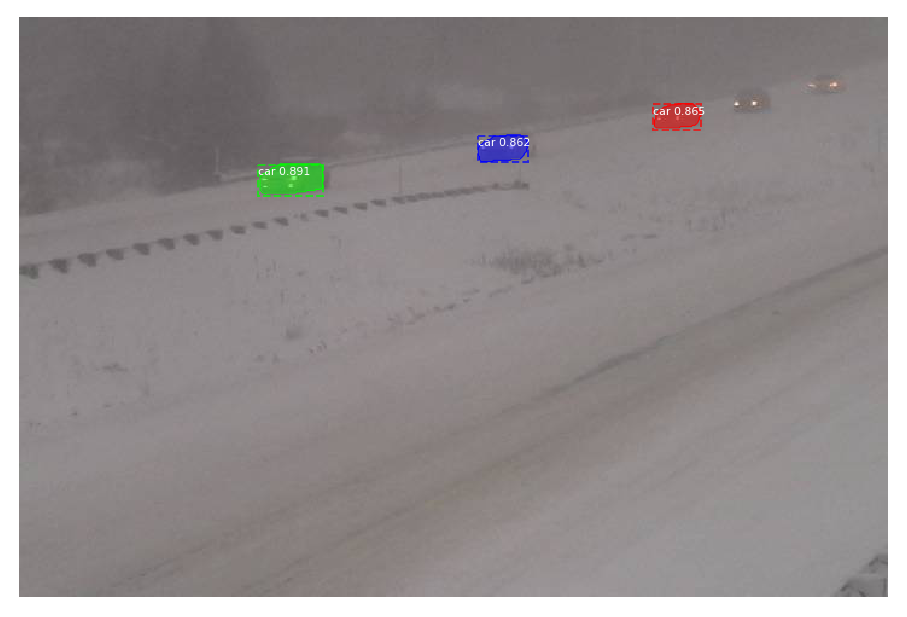

Processing 1 images
image                    shape: (480, 720, 3)         min:   84.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


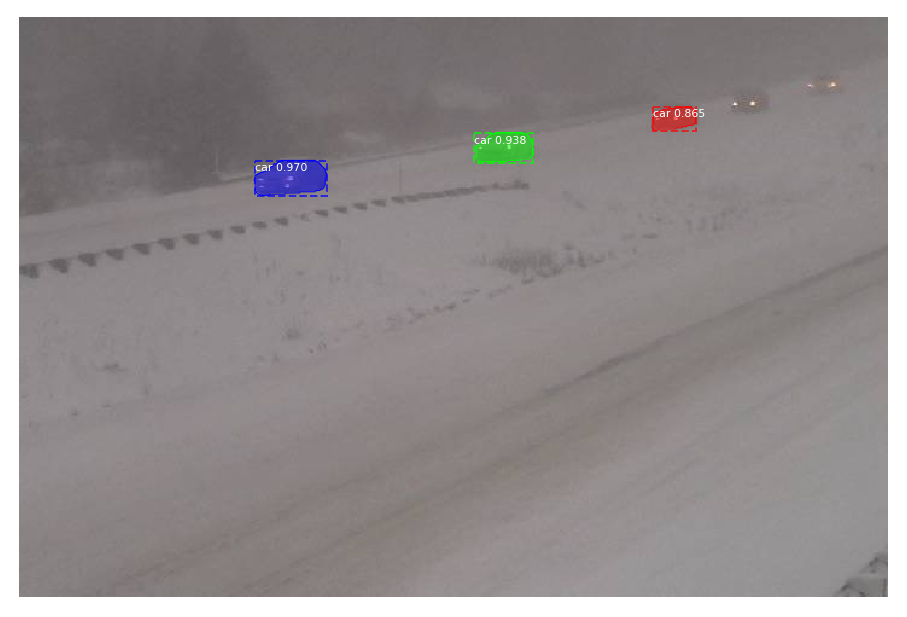

Processing 1 images
image                    shape: (480, 720, 3)         min:   87.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  131.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


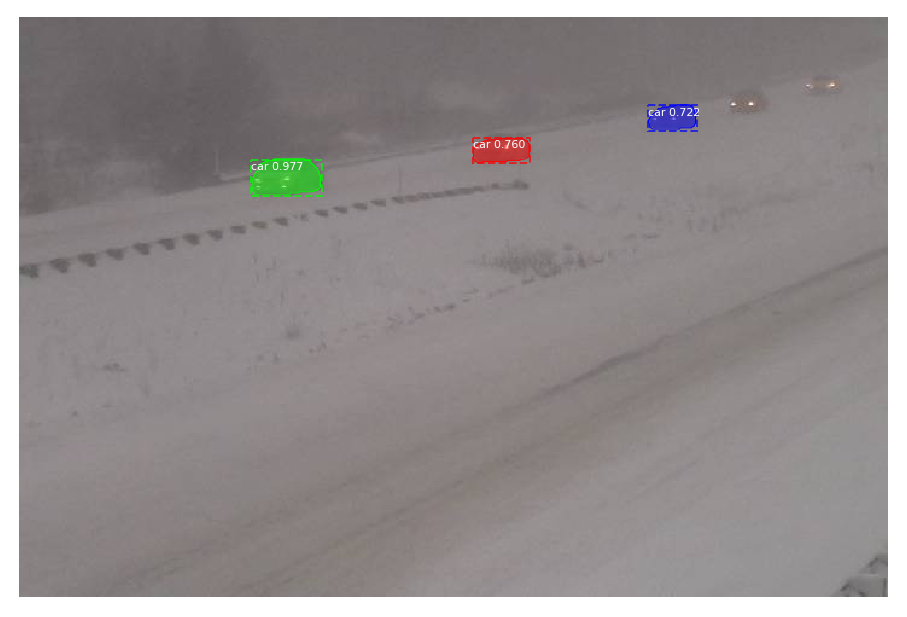

In [140]:
#Testing under the blizzard environmental condition

directory = '/content/Mask_RCNN/blizzard/input'
frames = ["in001023.jpg", "in001024.jpg", "in001025.jpg", "in001026.jpg", "in001027.jpg", "in001028.jpg"]
for file in frames:
    image = skimage.io.imread(os.path.join("/content/Mask_RCNN/blizzard/input", file))
    # Run detection
    results = model.detect([image], verbose=1)
    # Visualize results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                        class_names, r['scores'])

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


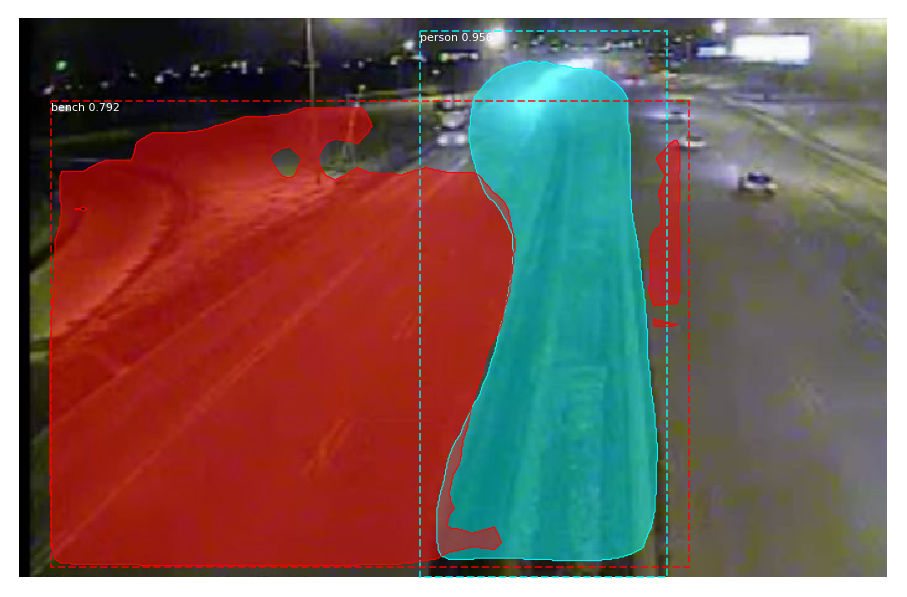

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


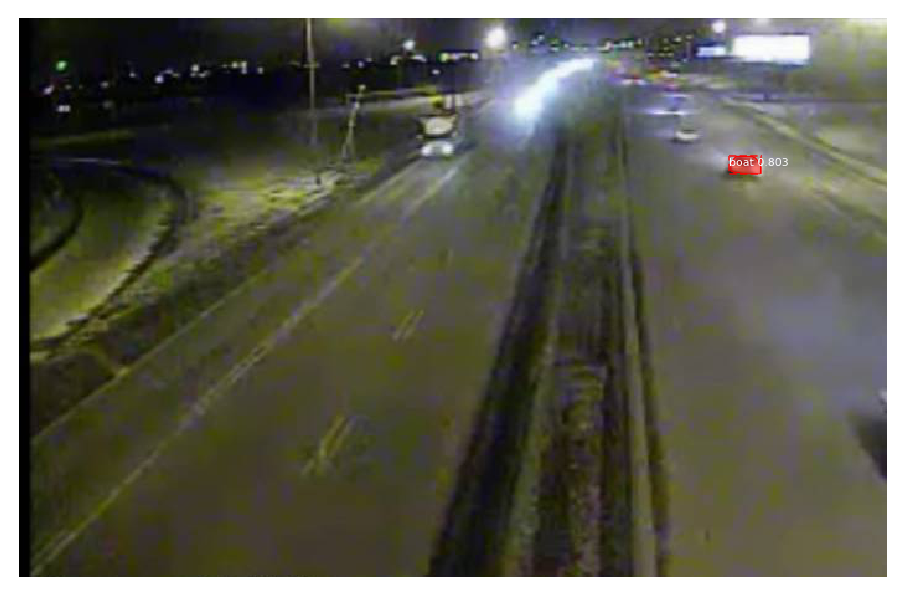

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


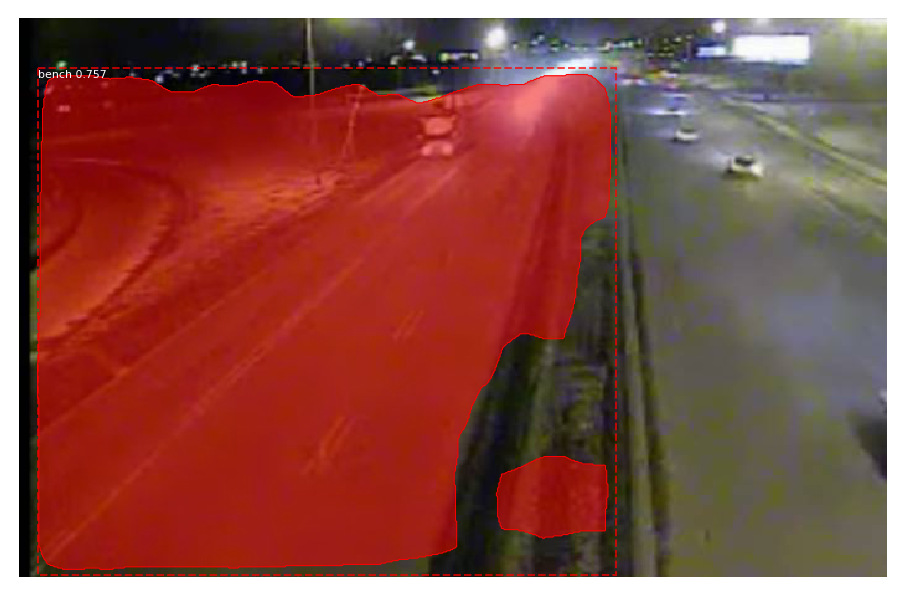

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


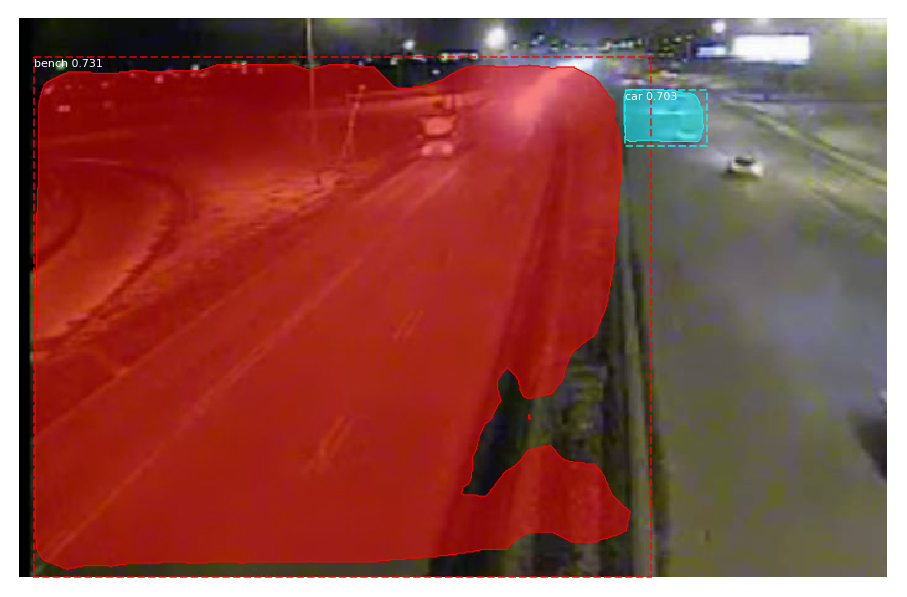

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


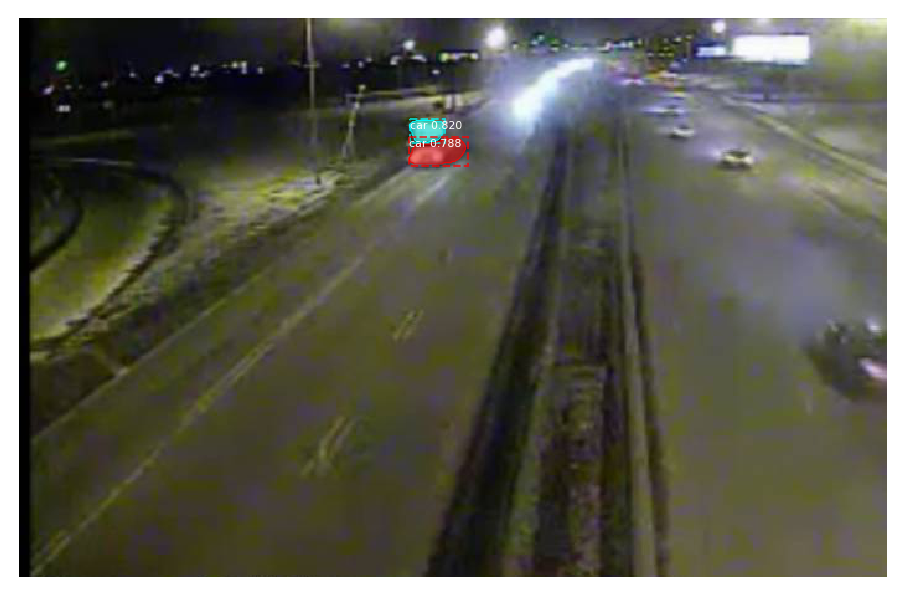

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


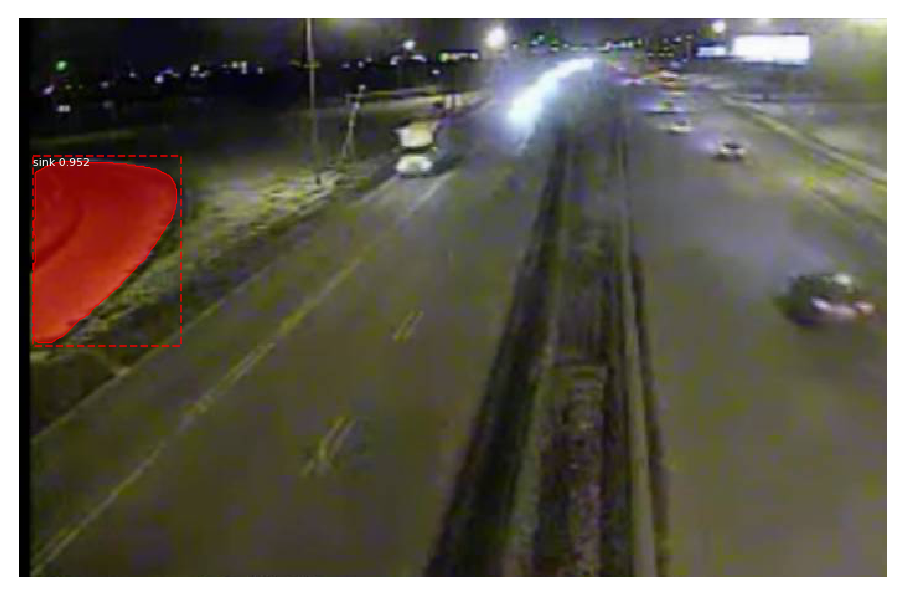

In [141]:
#Testing under the nighttime environmental condition

directory = '/content/Mask_RCNN/nightVideos/input'
frames = ["in000004.jpg", "in000005.jpg", "in000006.jpg", "in000007.jpg", "in000008.jpg", "in000011.jpg"]
for file in frames:
    image = skimage.io.imread(os.path.join("/content/Mask_RCNN/nightVideos/fluidHighway/input", file))
    # Run detection
    results = model.detect([image], verbose=1)
    # Visualize results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                        class_names, r['scores'])

In [0]:
#Quantitative Evaluation
# import the necessary packages
from collections import namedtuple
import numpy as np

import cv2
import numpy as np
import glob
import argparse
import time, datetime
from matplotlib import pyplot as plt
from collections import namedtuple
import random as rng
 
# define the `Detection` object
Detection = namedtuple("Detection", ["image_path", "gt", "pred"])

In [0]:
#Calculating IoU

def bb_intersection_over_union(boxA, boxB):
	# determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
 
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
 
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
 
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
 
	# return the intersection over union value
	return iou

In [0]:
# Sources: https://docs.opencv.org/3.4.9/da/d0c/tutorial_bounding_rects_circles.html (with modifications)
#          https://www.pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection/ (with modifications)

threshold = 100
total_time = datetime.timedelta(seconds=0)
Detection = namedtuple("Detection", ["image_path", "gt", "pred"])
avg_iou = {'Bad_Weather': [], 'Baseline': [], 'Night_Videos': []}
j = 0
tot = 0

for subset in glob.glob('.\content\Mask_RCNN\*'):

    print('Processing ' + subset + ' ..')
    
    it = 0
    
    if 'Baseline' in subset:
        bname = r'.\content\Mask_RCNN\Baseline\pedestrian detection dataset\pedestrians'
        continue
    elif 'Bad_Weather' in subset:
        bname = r'.\content\Mask_RCNN\blizzard'
        continue
    else:
        bname = r'.\content\Mask_RCNN\nightVideos\fluidHighway'
    
    iou, sum_iou = 0, 0
    
    glob_min_iou = 100000
    glob_max_iou = -100000

    
    for img, gt in zip(glob.glob(bname+'\input\*.jpg'), glob.glob(bname+'\groundtruth\*.png')):
        
        print(it)
        if it == 0:

            old_frame = skimage.io.imread(img)

            old_gray = skimage.io(old_frame, cv2.COLOR_BGR2GRAY)

            hsv = np.zeros_like(old_frame)
            hsv[...,1] = 255

            it += 1
            total_time = datetime.timedelta(seconds=0)

        elif it == 1000:
            print('break')
            break
            
        else:
            # read frame and groundtruth
            frame = skimage.io.imread(img)
            gt = skimage.io.imread(gt)
            frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

            # calculate optical flow and run time
            prev_time = time.time()

						

            flow = model.detect(old_frame, verbose=1)

            run_time = datetime.timedelta(seconds=time.time() - prev_time)
            total_time += run_time

            mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
            hsv[...,0] = ang*180/np.pi/2
            hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
            bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

            k = cv2.waitKey(60) & 0xff
            if k == 27:
                break

            #IOU eval
            print('\tIOU evaluation ..')
            
            #BBoxes generation
            
            ret, threshed_img = cv2.threshold(cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY), 50, 255, cv2.THRESH_BINARY)
            ret_gt, threshed_img_gt = cv2.threshold(cv2.cvtColor(gt, cv2.COLOR_BGR2GRAY), 100, 255, cv2.THRESH_BINARY)
            
            _, contours, _ = cv2.findContours(cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
            _, contours_gt, _ = cv2.findContours(threshed_img_gt, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                        
            contours_poly = [None]*len(contours)
            boundRect = [None]*len(contours)
            for i, c in enumerate(contours):
                contours_poly[i] = cv2.approxPolyDP(c, 3, True)
                boundRect[i] = cv2.boundingRect(contours_poly[i])
                
            contours_poly_gt = [None]*len(contours_gt)
            boundRect_gt = [None]*len(contours_gt)
            for i, c in enumerate(contours_gt):
                #print(i)
                contours_poly_gt[i] = cv2.approxPolyDP(c, 3, True)
                boundRect_gt[i] = cv2.boundingRect(contours_poly_gt[i])
            
            for i in range(len(contours)):
                color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
                cv2.rectangle(threshed_img, (int(boundRect[i][0]), int(boundRect[i][1])), \
                  (int(boundRect[i][0]+boundRect[i][2]), int(boundRect[i][1]+boundRect[i][3])), color, 2)

            for i in range(len(contours_gt)):
                color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
                cv2.rectangle(gt, (int(boundRect_gt[i][0]), int(boundRect_gt[i][1])), \
                  (int(boundRect_gt[i][0]+boundRect_gt[i][2]), int(boundRect_gt[i][1]+boundRect_gt[i][3])), color, 2)
            
            fig2 = plt.figure(figsize=(25, 25))
            
            x = fig2.add_subplot(1, 2, 1)
            x.set_title('contours')
            plt.imshow(threshed_img)
            
            y = fig2.add_subplot(1, 2 , 2)
            y.set_title('Contours_gt')
            plt.imshow(gt)
            plt.show()
            
            #IOU calcul
            n = 0
            sum_iou = 0
            if len(contours) != 0 and len(contours_gt) != 0:
                max_iou = 0.0
                min_iou = 1.0
                for l in range(len(contours)):
                    for k in range(len(contours_gt)):
                        iou = bb_intersection_over_union((boundRect_gt[k][0], boundRect_gt[k][1], boundRect_gt[k][0]+boundRect_gt[k][2], boundRect_gt[k][1]+boundRect_gt[k][3]), (boundRect[l][0], boundRect[l][1], boundRect[l][0]+boundRect[l][2], boundRect[l][1]+boundRect[l][3]))
                        if iou > 0.0:
                            #print(iou)
                            n += 1
                        if iou < min_iou:
                            min_iou = iou
                        if iou > max_iou:
                            max_iou = iou
                        if iou < glob_min_iou:
                            glob_min_iou = iou
                        if iou > glob_max_iou:
                            glob_max_iou = iou
                        sum_iou += iou

                if n >= 0:
                    print('\t\tIOU score for image '+str(it)+': '+str(max_iou))
                    avg_iou[subset.split("\\")[2]].append(max_iou)
                    tot += 1
            
            old_gray = frame_gray
            it += 1
    
    print('\tTotal = '+str(tot))
    print('\tAverage IOU score for subset '+subset+' = ' + str(sum(avg_iou[subset.split("\\")[2]])/tot) + '\n')
    print('\tMax IOU score for subset '+subset+' = ' + str(glob_max_iou) + '\n')
    print('\tMin IOU score for subset '+subset+' = ' + str(glob_min_iou) + '\n')
    #print('\tAverage runtime for subset '+subset+' = ' + str(total_time/1000) + '\n')
    j += 1
    
cv2.destroyAllWindows()
